In [47]:
import agentpy as ap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import IPython
from stochastic.processes.continuous import FractionalBrownianMotion
from stochastic.processes.continuous import BrownianMotion
from stochastic.processes.continuous import MultifractionalBrownianMotion

In [156]:
from fbm import FBM


class Base_Agent(ap.Agent):

    def setup(self):
        # Function to provide a Hurst value for each time step
        def hurst_func(t):
            return 0.5 + 0.4 * np.sin(t)

        self.x, self.y, self.z = [], [], []
        timesteps = self.p.steps * self.p.fps
        times = [i / self.p.fps for i in range(timesteps + 1)]

        # Create MfBM instances for x, y, z
        mfmb_x =  MultifractionalBrownianMotion(hurst=hurst_func, t= 1)
        mfmb_y =  MultifractionalBrownianMotion(hurst=hurst_func, t= 1)
        mfmb_z =  MultifractionalBrownianMotion(hurst=hurst_func, t= 1))

        # Generate MfBM sample paths
        x_sample = 50 * mfmb_x.sample(self.p.steps)
        y_sample = 50 * mfmb_y.sample(self.p.steps)
        z_sample = 50 * mfmb_z.sample(self.p.steps)

        # Compute the differences for steps
        for i in range(timesteps):
            self.x.append(x_sample[i + 1] - x_sample[i])
            self.y.append(y_sample[i + 1] - y_sample[i])
            self.z.append(z_sample[i + 1] - z_sample[i])


    def setup_space(self, space):
        self.space = space
        self.in_contact = 0 #0 for not in contact and 1 for in contact
        self.stp_num = 0 #each agent carries the step number so they know which position to move to
        self.neighbors = space.neighbors
        self.pos = space.positions[self]
        self.hit = 0
        self.h_count = 0
        self.CILrand = 0
        
    def update_stp_num(self):
        self.stp_num += 1
        self.space.record_positions(label='dimension') #record position after each sept to enable calculations, having it here makes it belong to the agent, not the model
        if self.hit == 1 and self.h_count == 0: #At the position where the hit occurs, record the collision
            self.record('Collision position', 'True')
        else:
            self.record('Collision position', 'False')
          
    def border_check(self): #Reflect off border
       #For each of the 3 dimensions
        if self.pos[0] >= self.p.size_x -1 : #Maximum edge
            self.x[self.stp_num*self.p.fps:(self.stp_num+10)*self.p.fps] = -1
        elif self.pos[0] <= 1: #Minimum edge
            self.x[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] = self.x[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] * -1
            
        if self.pos[1] >= self.p.size_y - 1: #Maximum edge
            self.y[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] = self.y[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] * -1
        elif self.pos[1] <= 1: #Minimum edge
            self.y[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] = self.y[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] * -1

        if self.pos[2] >= self.p.size_z - 1: #Mazimum edge
            self.z[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] = self.z[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] * -1
        elif self.pos[2] <= 1: #Minimum edge
            self.z[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] = self.z[self.stp_num*self.p.fps:(self.stp_num+100)*self.p.fps] * -1
    


In [157]:

class MyAgent(Base_Agent):
    
    
    def update_position(self):
        temp = np.array([])
        temp = np.append(temp, self.x[self.stp_num] )
        temp = np.append(temp, self.y[self.stp_num] )
        temp = np.append(temp, self.z[self.stp_num] )
        #self.border_check()
        self.space.move_by(self, temp)




    def update_position_with_collisions(self): #collision = CIL in this case
        temp = np.array([])
        if self.hit == 0:
            temp = np.append(temp, self.x[self.stp_num])
            temp = np.append(temp, self.y[self.stp_num])
            temp = np.append(temp, self.z[self.stp_num])


        #CILRAND means the same sequence isnt chosen each time CIL is activated
        if self.hit == 1:  # change Hurst exponent for 10 steps
            ib = self.h_count
            temp = np.append(temp, self.x2[ib + int(self.CILrand)] )
            temp = np.append(temp, self.y2[ib + int(self.CILrand)])
            temp = np.append(temp, self.z2[ib + int(self.CILrand)])
            self.h_count += 1
            if self.h_count == 10: #10 steps is arbitrary
                self.h_count = 0
                self.hit = 0
                self.CILrand = np.random.uniform(0,(self.p.steps-10))

        # self.border_check()
        self.space.move_by(self, temp)

        if len(self.neighbors(self, distance=parameters.get('collision_distance'))) >= 1:
            # reflect the original agent's path causing the collision:
            self.collision_position = self.pos  # record position of collision for the heat map
            self.hit = 1
            for neighbour in self.neighbors(self, distance=1):
                # there is a collision
                neighbour.hit = 1







In [158]:
# Create an empty list to store arrays
midpositions_list = []

# Loop 100 times and append an array of floats to the list
for _ in range(100): # or whatever population is
    midpositions_list.append(np.array([50.00000000, 50.00000000, 50.00000000], dtype=float))

# Convert the list to a NumPy array
midline_positions = np.array(positions_list)


NameError: name 'positions_list' is not defined

In [159]:


class MyModel(ap.Model):
    
    #def setup(self):
    #    self.space = ap.Space(self, shape=[self.p.size_x]+[self.p.size_y]+[self.p.size_z], torus=False)
    #    self.agents = ap.AgentList(self, self.p.population, MyAgent)
    #    self.space.add_agents(self.agents, random=True) #agents start in random positions, If not starting random and giving an array make sure it has enought decimals otherwise it will break.
    #    self.agents.setup_space(self.space)

    def setup(self):
        self.space = ap.Space(self, shape=[self.p.size_x]+[self.p.size_y]+[self.p.size_z], torus=False)
        self.agents = ap.AgentList(self, self.p.population, MyAgent)
        self.space.add_agents(self.agents, positions=midpositions_list)
        self.agents.setup_space(self.space)
        
        
    def step(self):
        if self.p.collisions== 'on':#take collisions into account
            
            counter = 0
            while counter < self.p.fps:
                self.agents.update_position_with_collisions()
                counter+=1
        else:
            self.agents.update_position()
        self.agents.update_stp_num()                                                                                                                                                                  

In [160]:

parameters = {
    'hurst': 0.5,
    'size_x': 1000,
    'size_y': 1000,
    'size_z': 1000,
    'steps': 100, 
    'population': 100,
    'collisions': 'off',
    'fps': 1, #changing this still gives TMSD agreeing with results
    'collision_distance': 1, 
    'Diffcoeff': 50
}

In [161]:
model = MyModel(parameters)
results = model.run()

#results.variables.MyModel.head() 
Agent_Variable_List = results.variables.MyAgent

ValueError: Time end value must be positive.

In [141]:
sx,sy,sz =[],[],[]
sx.extend( Agent_Variable_List['dimension0'])
sx = np.array(sx)
chunked_arrays = np.array_split(sx, parameters.get('population')) #Split the list into as many lists as there are particles. seperates out x data for each particle
sx = [list(array) for array in chunked_arrays]
#Do the same for y values:
sy.extend( Agent_Variable_List['dimension1'])
sy = np.array(sy)
chunked_arrays = np.array_split(sy, parameters.get('population')) 
sy = [list(array) for array in chunked_arrays]
sz.extend( Agent_Variable_List['dimension2'])
sz = np.array(sz)
chunked_arrays = np.array_split(sz, parameters.get('population')) #Split the list into as many lists as there are particles. seperates out x data for each particle
sz = [list(array) for array in chunked_arrays]

In [142]:


data = {
    'Position X': np.concatenate(sx),
    'Position Y': np.concatenate(sy),
    'Position Z': np.concatenate(sz),
    'Time': np.tile(np.arange(len(sx[0])), parameters.get('population')),
    'TrackID': np.repeat(np.arange(parameters.get('population')), len(sx[0]))
    
}

df = pd.DataFrame(data)

# Export to CSV
df.to_csv('D:/agmdata2.csv', index=False)


In [143]:
def Calculate_TMSD (time_lag, number_of_particles):
    tmsd = [] 
    for j in range (number_of_particles): #for each walk
        msd_r, msd_diff_sq, msd_r_timelag, msd_diff_sq_x, msd_diff_sq_y, msd_diff_sq_z = [],[],[],[],[],[] #create a list of lists for: all r values at each step, and squared differences, and r values with timelag
        x,y,z,r = [],[],[],[]
        x.extend((sx[j][::time_lag])) # Using extend instead of append creates a list with each element it's own, not inserting the whole list into element [0] of msd_r_timelag
        y.extend((sy[j][::time_lag]))
        z.extend((sz[j][::time_lag]))
        
        for i in range (len(x)-1): #difference has length of number of steps -1 so this avoids "out of range erros"
            msd_diff_sq_x.append((x[i+1] - x[i])**2) #create a list of the square displacement for each particle for each step
            msd_diff_sq_y.append((y[i+1] - y[i])**2)
            msd_diff_sq_z.append((z[i+1] - z[i])**2)
            msd_diff_sq.append(msd_diff_sq_x[i] + msd_diff_sq_y[i] + msd_diff_sq_z[i]) #Calculate each one and add themtogether (see theory)

        tmsd.append(sum(msd_diff_sq)/len(msd_diff_sq)) #Add the TMSD for each walk to the list 
        
    tmsd = sum(tmsd)/len(tmsd) #average the TMSDs 
    del(msd_r, msd_diff_sq, msd_r_timelag,x,y,z,r,i,j) #clear from memory
    return tmsd

In [144]:
Calculate_TMSD(time_lag=1, number_of_particles=parameters.get('population'))

27.50030425171623

[0, 27.50030425171623, 37.67090065524632, 50.640612770388216, 64.2916331158186, 83.78320494669981, 104.30860634570094, 123.44083402100034, 142.87306329314092, 163.59655272052328, 194.3671610604831, 213.00696323656405, 237.89523766275056, 266.42068637051864, 289.7171291896169, 317.0985084488304, 346.8927366228585, 392.449458941531, 414.8248120495167, 447.68858650024623]


<function matplotlib.pyplot.show(close=None, block=None)>

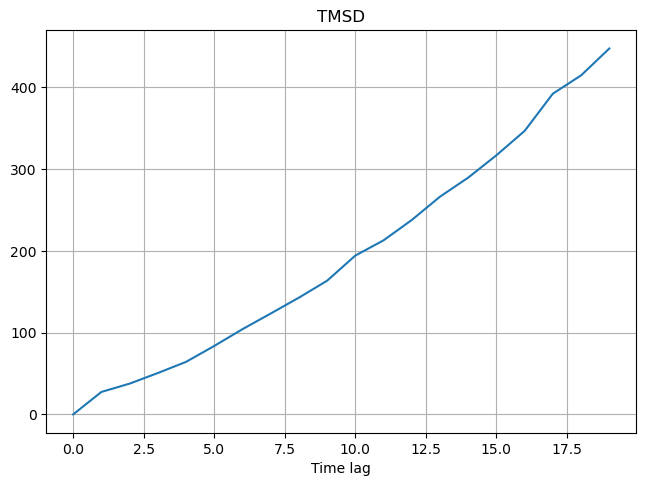

In [145]:
tmsd_variable_timelag =[0]
for k in range (1, 20):
    tmsd = [] 
    for j in range (parameters.get('population')): #for each walk
        msd_r, msd_diff_sq, msd_r_timelag, msd_diff_sq_x, msd_diff_sq_y, msd_diff_sq_z = [],[],[],[],[],[] #create a list of lists for: all r values at each step, and squared differences, and r values with timelag
        x,y,z,r = [],[],[],[]
        x.extend((sx[j][::k])) # Using extend instead of append creates a list with each element it's own, not inserting the whole list into element [0] of msd_r_timelag
        y.extend((sy[j][::k]))
        z.extend((sz[j][::k]))

        for i in range (len(x)-1): #difference has length of number of steps -1 so this avoids "out of range erros"
            msd_diff_sq_x.append((x[i+1] - x[i])**2) #create a list of the square displacement for each particle for each step
            msd_diff_sq_y.append((y[i+1] - y[i])**2)
            msd_diff_sq_z.append((z[i+1] - z[i])**2)
            msd_diff_sq.append(msd_diff_sq_x[i] + msd_diff_sq_y[i] + msd_diff_sq_z[i]) #Calculate each one and add themtogether (see theory)

        tmsd.append(sum(msd_diff_sq)/len(msd_diff_sq)) #Add the TMSD for each walk to the list 
        
    tmsd = sum(tmsd)/len(tmsd) #average the TMSDs 
    tmsd_variable_timelag.append(tmsd)
    del(msd_r, msd_diff_sq, msd_r_timelag, tmsd,x,y,z,r,i,j,k) #clear from memory
print (tmsd_variable_timelag)

fig, axs = plt.subplots(1)
#sanity check the results for first particle
axs.plot(tmsd_variable_timelag)
axs.set_title('TMSD')
plt.grid('True')
plt.xlabel  ('Time lag')
#x = np.linspace(0,20,100)
#y = x
#plt.plot(x, y, '-r', label='y=2x+1')
fig.tight_layout(pad=0.5, h_pad=None, w_pad=None, rect=None)
plt.draw

plt.show # keep at bottom, once per run of program

In [146]:
#proving there are collisions taking place
print(Agent_Variable_List) 

            dimension0  dimension1  dimension2 Collision position
obj_id t                                                         
2      1     49.544424   49.173424   48.258552              False
       2     48.965864   48.358476   40.241663              False
       3     48.399513   49.012683   41.833365              False
       4     48.303921   51.943028   30.432596              False
       5     47.980736   53.736821   37.630877              False
...                ...         ...         ...                ...
101    96    66.746853   70.685798   32.372377              False
       97    67.023869   70.984273   31.734978              False
       98    65.242581   74.026926   31.338200              False
       99    65.667594   73.270896   31.469975              False
       100   66.422422   75.337779   31.697723              False

[10000 rows x 4 columns]


<function matplotlib.pyplot.show(close=None, block=None)>

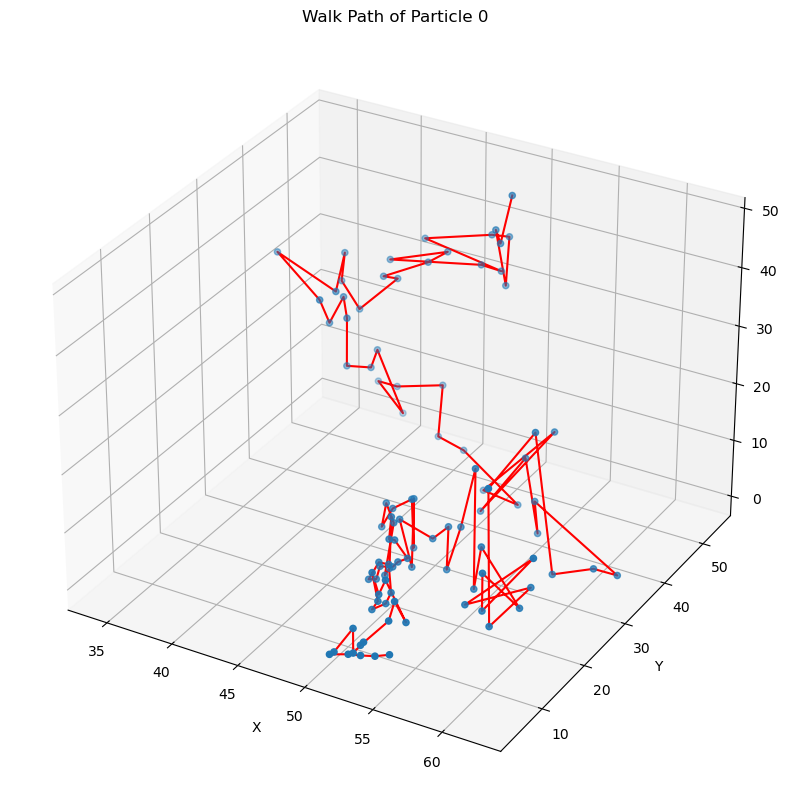

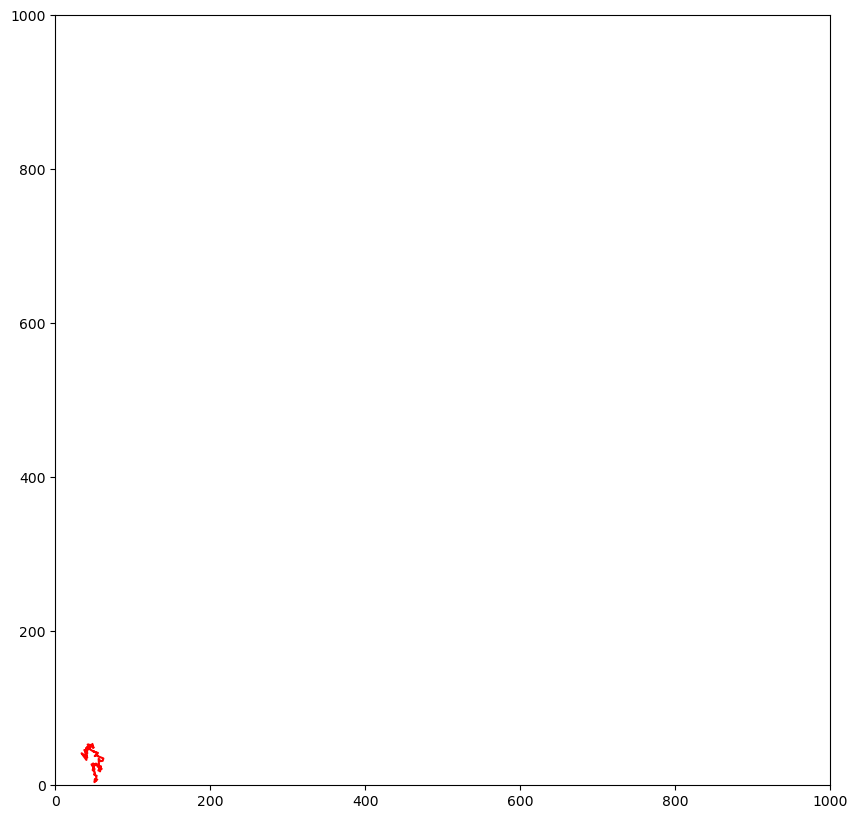

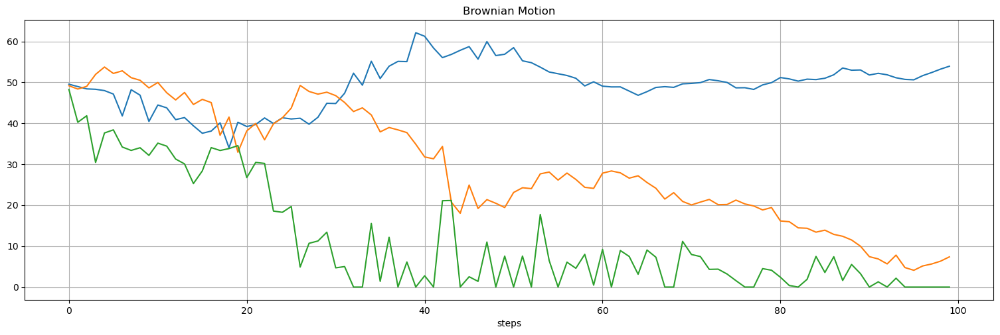

In [147]:
fig = plt.figure(figsize=(10,10)) #Reducing this makes it animate faster
ax3 = plt.axes(projection="3d")
plt.title('Walk Path of Particle 0')
plt.xlabel('X')
plt.ylabel('Y')
ax3.plot3D(sx[0],sy[0],sz[0], 'red') # plotting a 3D line graph with X-coordinate, Y-coordinate and Z-coordinate respectively
ax3.scatter3D(sx[0],sy[0],sz[0]) # plotting a scatter plot
"""
ax3.set_xlim(0, parameters.get('size_x'))
ax3.set_ylim(0, parameters.get('size_y'))
ax3.set_zlim(0, parameters.get('size_z'))

ax3.set_xlim(0, [30,60])
ax3.set_ylim(0, [40,60])
ax3.set_zlim(0, [0,100])
"""
#Walk path of one particle
fig4, ax4 = plt.subplots(1, figsize=(10,10))
ax4.plot(sx[0],sy[0],'red') # plotting a 2D line graph with X-coordinate, Y-coordinate and Z-coordinate respectively
ax4.set_xlim(0, parameters.get('size_x'))
ax4.set_ylim(0, parameters.get('size_y'))


fig2, axs2 = plt.subplots(1,figsize=(15,5))
#sanity check the results for first particle
axs2.plot(sx[0])
axs2.plot(sy[0])
axs2.plot(sz[0])
axs2.set_title('Brownian Motion')
plt.grid('True')
plt.xlabel('steps')
fig2.tight_layout(pad=0.5, h_pad=None, w_pad=None, rect=None)

plt.draw

plt.show

In [148]:
def animation_plot_single(m, ax):
    ndim = 3
    ax.set_title(f"FBM Model {ndim}D t={m.t}")
    pos = m.space.positions.values()
    pos = np.array(list(pos)).T  # Transform (Transpose) positions of agents
    ax.scatter(*pos, s=1, c='black')
    #ax.set_xlim(0, m.p.size_x)
    #ax.set_ylim(0, m.p.size_y)
    #ax.set_zlim(0, m.p.size_z)
    #ax.set_xlim(45, 55)
    #ax.set_ylim(45, 55)
    #ax.set_zlim(45, 55)

def animation_plot(m, p):
    projection = '3d'
    fig = plt.figure(figsize=(7,7)) #Reducing this makes it animate faster
    ax = fig.add_subplot(111, projection=projection)
    animation = ap.animate(m(p), fig, ax, animation_plot_single)
    return IPython.display.HTML(animation.to_jshtml(fps=10))

In [149]:
#Different from model results? Probably re-run
animation_plot(MyModel, parameters)
#you will see particles overlapping with as they collide and then rebound off each other but do not go through each other
#or may be passing each other but only aligned in 2d not in the third dimension also
